## Janus Pro Politician Probing and Image Steering

This notebook block:
1. Builds politician prompts/labels from DW-Nominate data.
2. Probes Janus-Pro's language model with `probe_heads` from `utils.py`.
3. Saves a reusable politician steering direction.
4. Applies that direction while generating images with Janus-Pro.

In [2]:
import os
import pickle
import random

import numpy as np
import pandas as pd
import torch
import PIL.Image

from baukit import TraceDict
from transformers import AutoModelForCausalLM
from janus.models import MultiModalityCausalLM, VLChatProcessor

from utils import (
    set_seed,
    probe_heads,
    load_ridge_models,
    compute_combined_coefs,
    topk_head_indices,
    load_feats
)

SEED = 42
set_seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

JANUS_MODEL_PATH = "/home/tzhang3/jevans/models/Janus-Pro-7B"
RESULTS_DIR = "results"
PROBE_PREFIX = "politician"
TOP_K_HEADS = 16

model_path = JANUS_MODEL_PATH
os.makedirs("generated_samples", exist_ok=True)

Python version is above 3.10, patching the collections module.


/home/tzhang3/envs/linear-probe/lib/python3.12/site-packages/transformers/models/auto/image_processing_auto.py:617: FutureWarning: The image_processor_class argument is deprecated and will be removed in v4.42. Please use `slow_image_processor_class`, or `fast_image_processor_class` instead
  warnings.warn(


Set seed 42


In [2]:
# Build probing prompts and politician labels (DW-Nominate dimension 1).
df_members = pd.read_csv("data/HS116_members.csv")
df_members = df_members.loc[pd.notnull(df_members.nominate_dim1)].reset_index(drop=True)
df_members["first_middle_name"] = df_members["bioname"].apply(lambda x: x.split(", ")[1])
df_members["first_name"] = df_members["first_middle_name"].apply(lambda x: x.split(" ")[0] + " " if " " in x else x + " ")
df_members["middle_name"] = df_members["first_middle_name"].apply(lambda x: x.split(" ")[1][0] + ". " if " " in x else "")
df_members["last_name"] = df_members["bioname"].apply(lambda x: x.split(", ")[0].lower().capitalize().strip())
df_members["fullname"] = df_members["first_name"] + df_members["middle_name"] + df_members["last_name"]

def build_politician_prompt(fullname: str) -> str:
    return (
        f"USER: Generate a political statement by {fullname}, a U.S. politician in 2019.\n"
        f"ASSISTANT: In 2019, {fullname} said that"
    )

probe_prompts_text = df_members["fullname"].apply(build_politician_prompt).tolist()
fullname_text = df_members["fullname"].tolist()
probe_labels = df_members["nominate_dim1"].astype(float).values

print(f"Prepared {len(probe_prompts_text)} prompts for probing.")

Prepared 552 prompts for probing.


In [3]:
# Load Janus-Pro and its tokenizer/processor.
vl_chat_processor: VLChatProcessor = VLChatProcessor.from_pretrained(JANUS_MODEL_PATH)
janus_tokenizer = vl_chat_processor.tokenizer

vl_gpt: MultiModalityCausalLM = AutoModelForCausalLM.from_pretrained(
    JANUS_MODEL_PATH,
    trust_remote_code=True,
    dtype=torch.bfloat16,
)
vl_gpt = vl_gpt.to(torch.bfloat16).to(device).eval()

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
You are using the default legacy behaviour of the <class 'transformers.models.llama.tokenization_llama_fast.LlamaTokenizerFast'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565 - if you loaded a llama tokenizer from a GGUF file you can ignore this message.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [7]:
import torch
from transformers import AutoModelForCausalLM
from janus.models import MultiModalityCausalLM, VLChatProcessor
from janus.utils.io import load_pil_images

def encode_prompt(prompt: str):
    """Encode vision model inputs using a chat template."""
    # load images and prepare for inputs
    prepare_inputs = vl_chat_processor(
        prompt=prompt, images=[], force_batchify=True
    ).to(vl_gpt.device)

    # run image encoder to get the image embeddings
    return {
        "inputs_embeds": vl_gpt.language_model.get_input_embeddings()(prepare_inputs.input_ids),
        "attention_mask": prepare_inputs.attention_mask.cpu(),
    }

In [8]:
prompts = [encode_prompt(p) for p in probe_prompts_text]

Extracting features:   0%|          | 0/552 [00:00<?, ?it/s]

Saved features and labels to results/janus-pro-7b/politician_features.pkl


Layers:   0%|          | 0/30 [00:00<?, ?it/s]

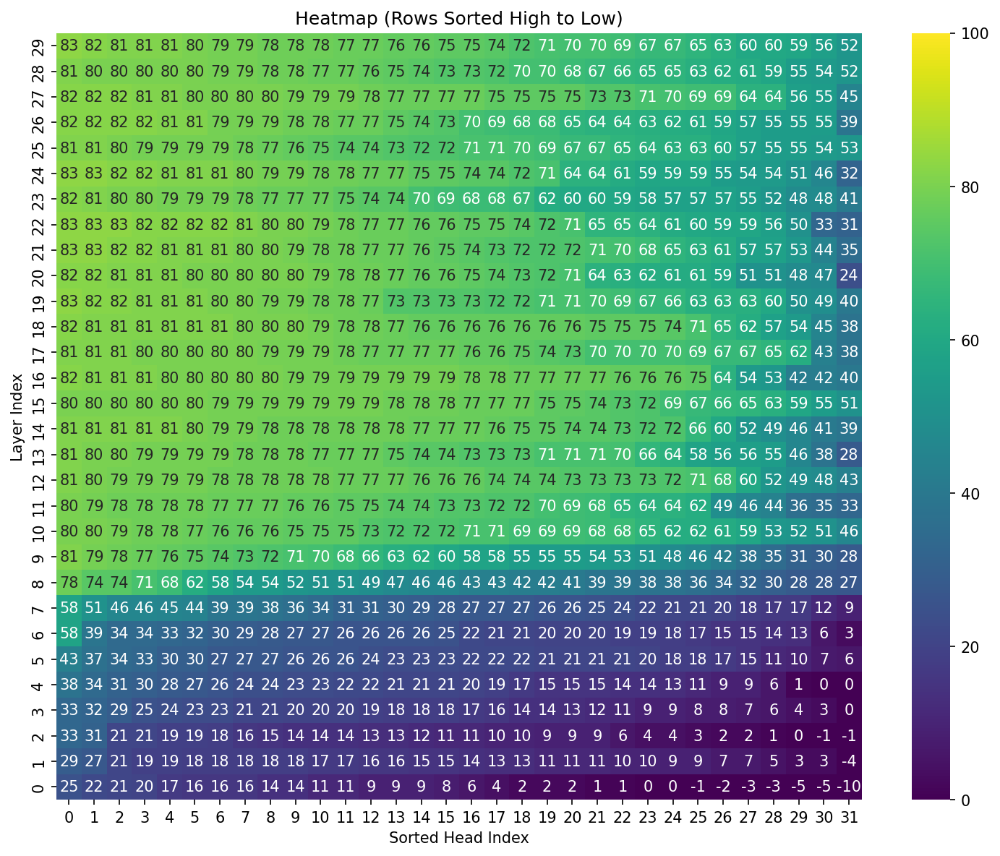

(<Axes: title={'center': 'Heatmap (Rows Sorted High to Low)'}, xlabel='Sorted Head Index', ylabel='Layer Index'>,
 array([[ 4.80077928e-04, -5.00174500e-02,  2.26904359e-02,
          9.19496864e-02,  2.16928571e-01,  1.61600634e-01,
          1.41446069e-01, -2.27532443e-02,  1.11099444e-02,
          9.31573212e-02, -1.51640726e-02,  6.05053082e-02,
         -1.04870088e-01,  8.43202025e-02,  4.59575728e-02,
          1.60979792e-01,  2.57150322e-01, -5.82139082e-02,
         -3.03176846e-02,  1.12859696e-01,  2.02872772e-02,
          2.05387309e-01,  1.63991004e-01,  5.09802299e-03,
          1.45264402e-01,  2.20747322e-01,  1.51240723e-02,
         -3.65427025e-02,  1.13012105e-01,  2.08793916e-02,
          1.79744899e-01,  9.02419686e-02],
        [ 1.81979030e-01,  5.88386990e-02,  1.96144059e-01,
          9.52109396e-02,  9.35596004e-02,  1.64227530e-01,
          1.96153328e-01,  7.75167793e-02,  1.81441665e-01,
          2.92623252e-01,  3.99027430e-02,  1.10261284e-01,
  

In [10]:
probe_heads(
    model_path=JANUS_MODEL_PATH,
    model=vl_gpt.language_model,
    prompts=prompts,
    labels=probe_labels,
    prefix="politician",
    alpha=1.0,
    n_splits=2,
    seed=SEED,
    data_dir="results",
    figsize=(10, 8),
    dpi=150,
    cmap='viridis',
    vmin=0,
    vmax=100,
    mode="vision",
    device=device
)

In [ ]:
# Generate Janus images with optional politician-direction steering.
@torch.inference_mode()
def generate_image_with_politician_steering(
    mmgpt: MultiModalityCausalLM,
    vl_chat_processor: VLChatProcessor,
    prompt: str,
    combined_coefs: torch.Tensor,
    alpha: float = 0.0,
    temperature: float = 1.0,
    parallel_size: int = 4,
    cfg_weight: float = 5.0,
    image_token_num_per_image: int = 576,
    img_size: int = 384,
    patch_size: int = 16,
    out_dir: str = "generated_samples",
    out_prefix: str = "janus_steered",
):
    os.makedirs(out_dir, exist_ok=True)

    text_lm = mmgpt.language_model
    n_layers = combined_coefs.shape[0]
    hook_names = [f"model.layers.{i}.self_attn.head_out" for i in range(n_layers)]
    steer = combined_coefs.to(text_lm.device, dtype=text_lm.dtype)

    input_ids = vl_chat_processor.tokenizer.encode(prompt)
    input_ids = torch.LongTensor(input_ids)

    tokens = torch.zeros((parallel_size * 2, len(input_ids)), dtype=torch.int, device=text_lm.device)
    for i in range(parallel_size * 2):
        tokens[i, :] = input_ids
        if i % 2 != 0:
            tokens[i, 1:-1] = vl_chat_processor.pad_id

    inputs_embeds = text_lm.get_input_embeddings()(tokens)
    generated_tokens = torch.zeros((parallel_size, image_token_num_per_image), dtype=torch.int, device=text_lm.device)

    past_key_values = None

    def edit_output(output, module_name):
        if alpha == 0.0:
            return output
        layer_idx = int(module_name.split(".")[2])
        output[:, -1] = output[:, -1] + alpha * steer[layer_idx]
        return output

    for i in range(image_token_num_per_image):
        with TraceDict(text_lm, hook_names, edit_output=edit_output):
            outputs = text_lm.model(
                inputs_embeds=inputs_embeds,
                use_cache=True,
                past_key_values=past_key_values,
            )

        past_key_values = outputs.past_key_values
        hidden_states = outputs.last_hidden_state

        logits = mmgpt.gen_head(hidden_states[:, -1, :])
        logit_cond = logits[0::2, :]
        logit_uncond = logits[1::2, :]
        logits = logit_uncond + cfg_weight * (logit_cond - logit_uncond)
        probs = torch.softmax(logits / temperature, dim=-1)

        next_token = torch.multinomial(probs, num_samples=1)
        generated_tokens[:, i] = next_token.squeeze(dim=-1)

        next_token = torch.cat([next_token.unsqueeze(dim=1), next_token.unsqueeze(dim=1)], dim=1).view(-1)
        img_embeds = mmgpt.prepare_gen_img_embeds(next_token)
        inputs_embeds = img_embeds.unsqueeze(dim=1)

    dec = mmgpt.gen_vision_model.decode_code(
        generated_tokens.to(dtype=torch.int),
        shape=[parallel_size, 8, img_size // patch_size, img_size // patch_size],
    )
    dec = dec.to(torch.float32).cpu().numpy().transpose(0, 2, 3, 1)
    dec = np.clip((dec + 1) / 2 * 255, 0, 255).astype(np.uint8)

    saved = []
    for i in range(parallel_size):
        save_path = os.path.join(out_dir, f"{out_prefix}_{i:02d}.jpg")
        PIL.Image.fromarray(dec[i]).save(save_path)
        saved.append(save_path)

    return saved

feats = load_feats(model_path=model_path, prefix="politician", device=device)
ridge_models, performance = load_ridge_models(model_path, "politician")
coefs = compute_combined_coefs(
    feats=feats,
    k=16,
    ridge_models=ridge_models,
    performance=performance,
    device=device,
)

In [31]:
conversation = [
    {
        "role": "<|User|>",
        "content": "A doctor from the U.S.",
    },
    {"role": "<|Assistant|>", "content": ""},
]

sft_format = vl_chat_processor.apply_sft_template_for_multi_turn_prompts(
    conversations=conversation,
    sft_format=vl_chat_processor.sft_format,
    system_prompt="",
)
img_prompt = sft_format + vl_chat_processor.image_start_tag

for alpha in [-100, -50, 50, 100]:
    saved_paths = generate_image_with_politician_steering(
        mmgpt=vl_gpt,
        vl_chat_processor=vl_chat_processor,
        prompt=img_prompt,
        combined_coefs=coefs,
        alpha=alpha,
        parallel_size=4,
        out_prefix=f"janus_doctor_alpha_{alpha}",
    )

Saved: generated_samples/janus_doctor_combined.png


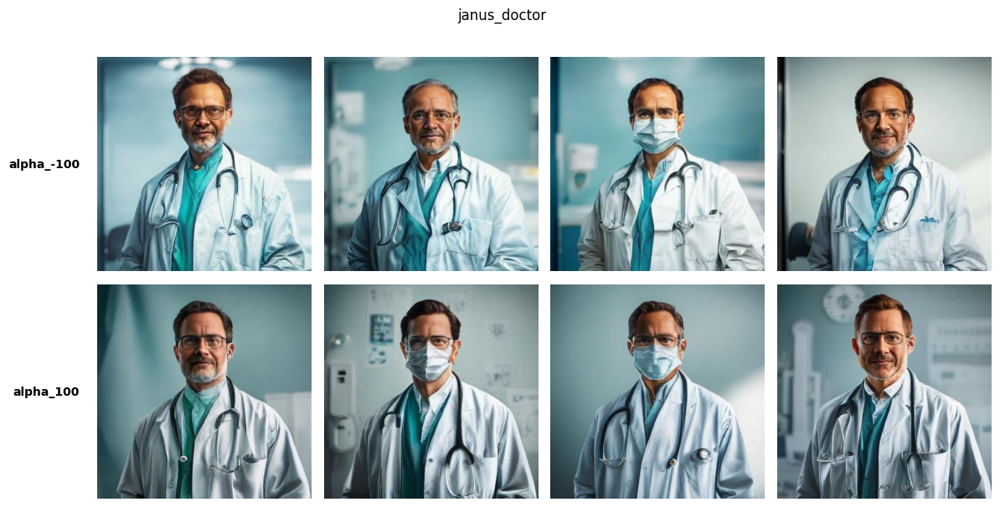

Saved: generated_samples/janus_doctor_alpha_-50_combined.png


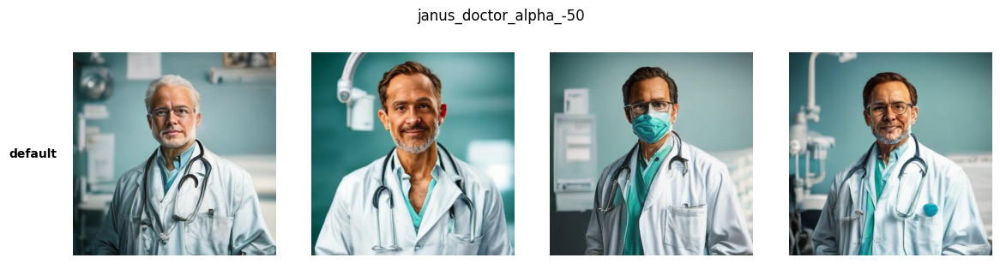

Saved: generated_samples/janus_doctor_alpha_50_combined.png


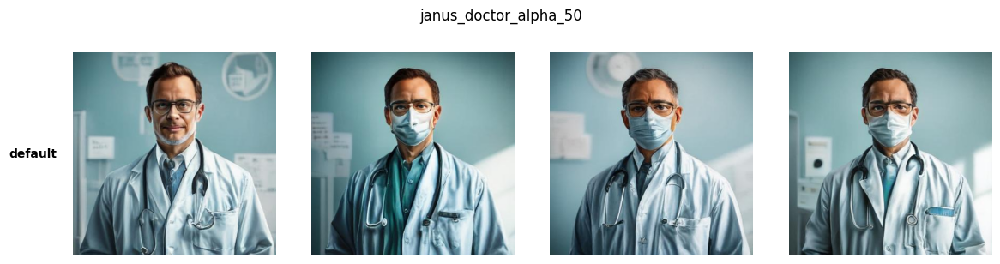

Saved: generated_samples/janus_hillary_combined.png


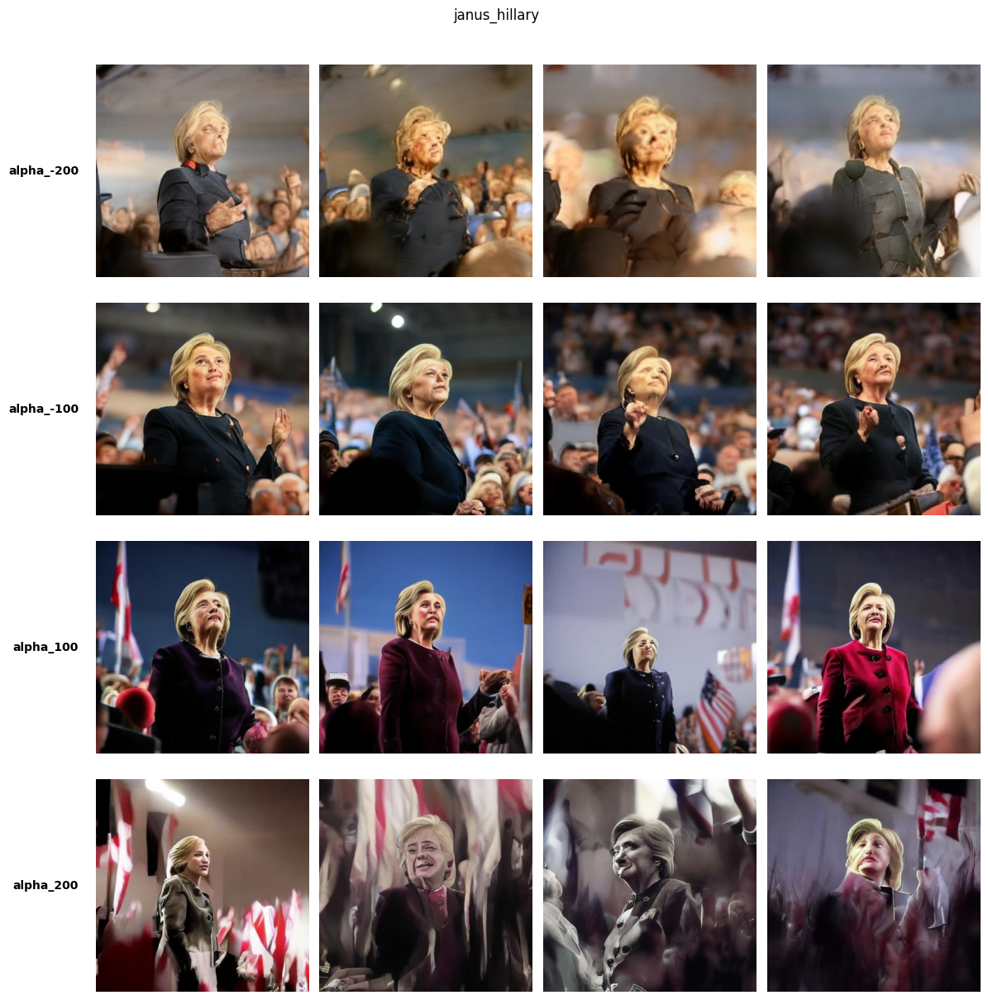

Saved: generated_samples/janus_hillary_alpha_-20_combined.png


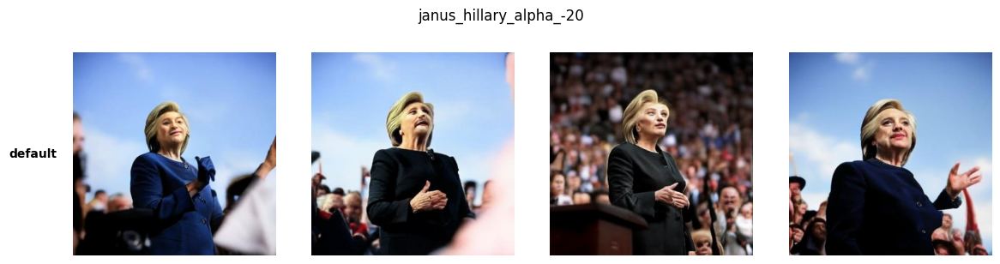

Saved: generated_samples/janus_hillary_alpha_-50_combined.png


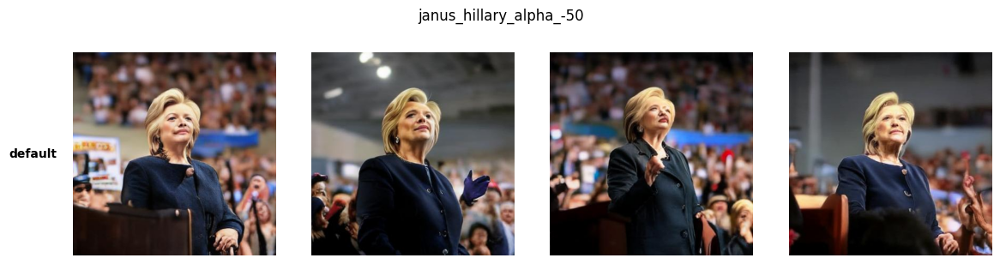

Saved: generated_samples/janus_hillary_alpha_20_combined.png


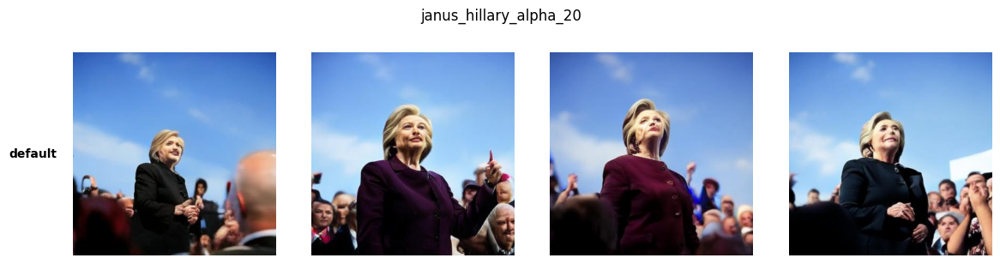

Saved: generated_samples/janus_hillary_alpha_50_combined.png


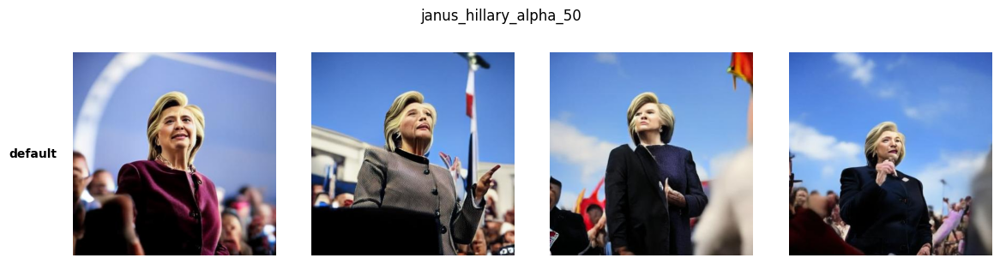

Saved: generated_samples/janus_party_symbol_alpha_-20_combined.png


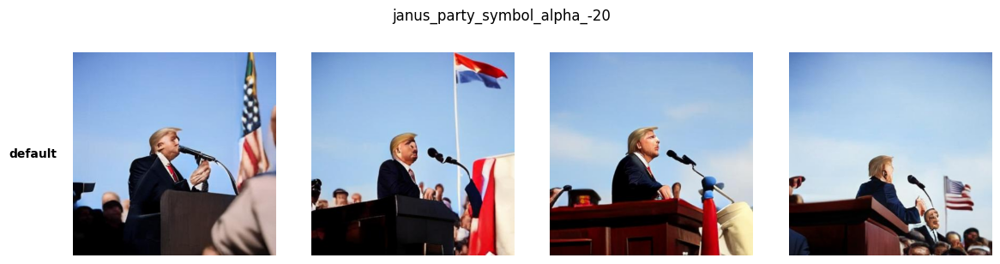

Saved: generated_samples/janus_party_symbol_alpha_-50_combined.png


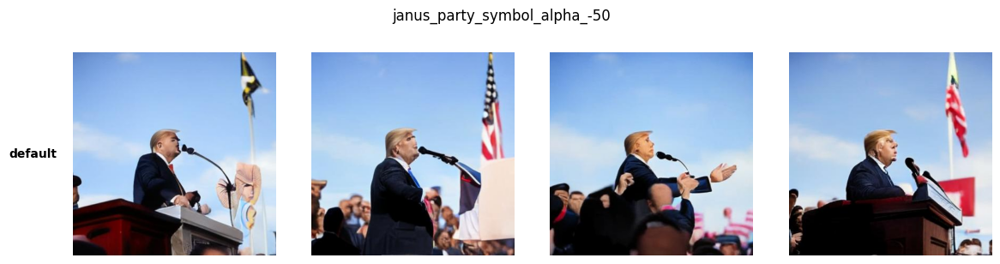

Saved: generated_samples/janus_party_symbol_alpha_20_combined.png


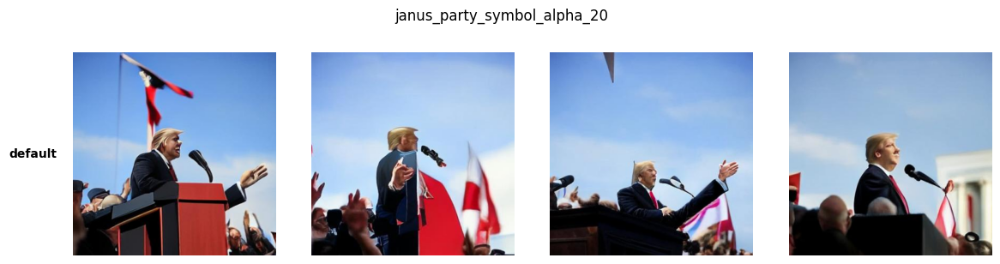

Saved: generated_samples/janus_party_symbol_alpha_50_combined.png


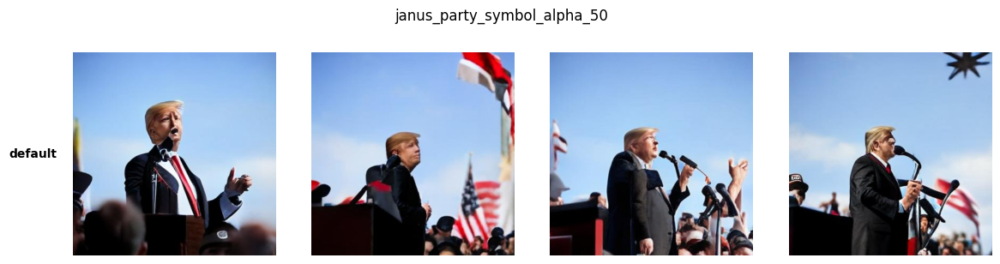

Saved: generated_samples/janus_politician_alpha_-20_combined.png


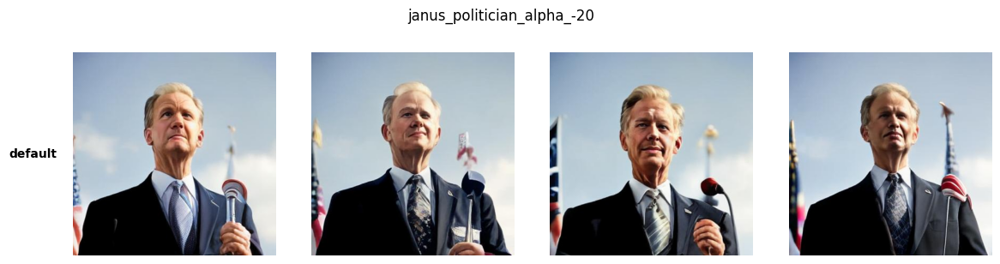

Saved: generated_samples/janus_politician_alpha_-50_combined.png


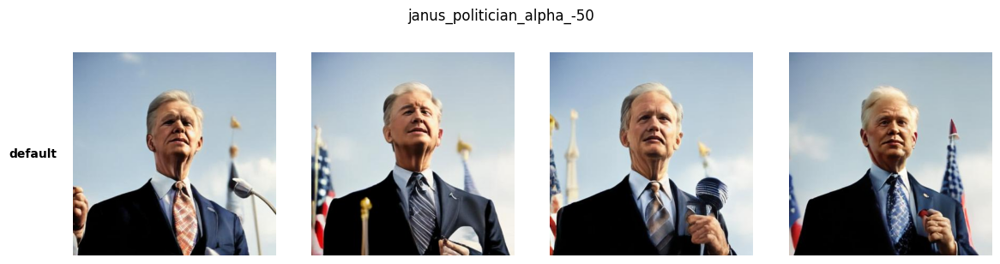

Saved: generated_samples/janus_politician_alpha_20_combined.png


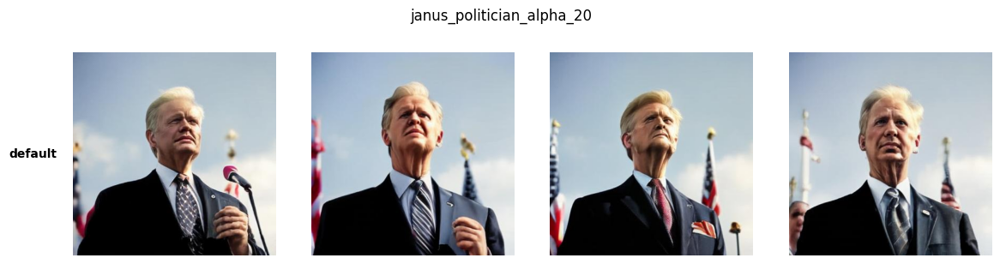

Saved: generated_samples/janus_politician_alpha_50_combined.png


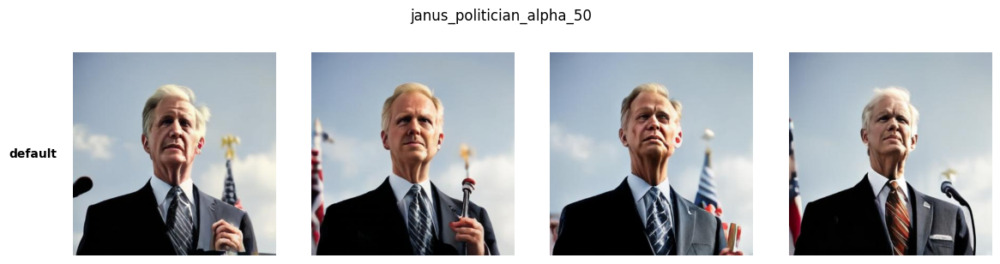

Saved: generated_samples/janus_president_combined.png


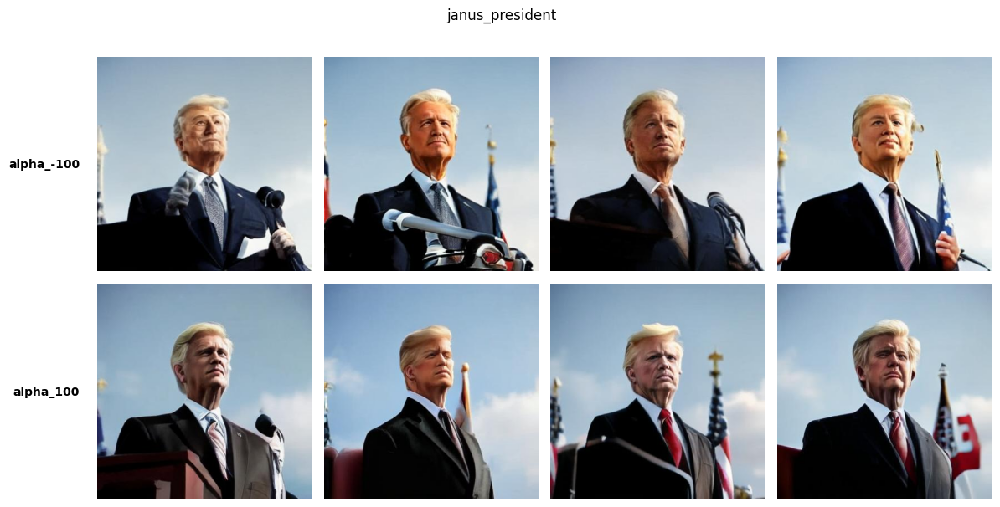

Saved: generated_samples/janus_president_alpha_-50_combined.png


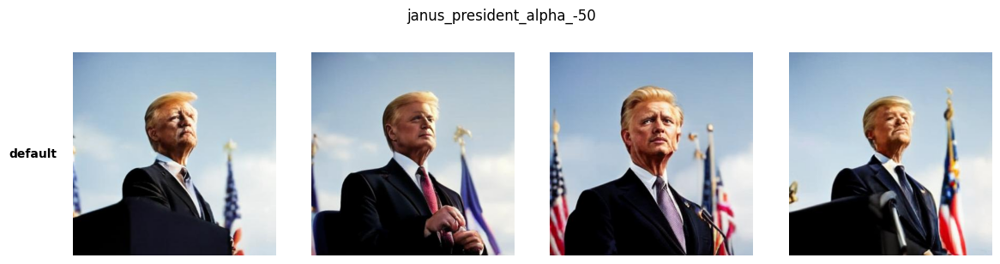

Saved: generated_samples/janus_president_alpha_50_combined.png


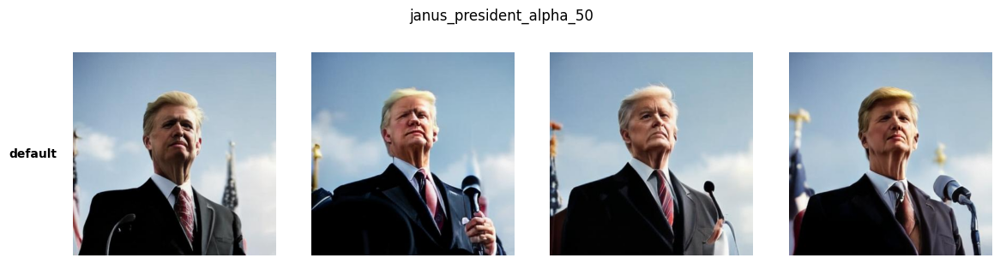

In [4]:
import re
from collections import defaultdict
from PIL import Image
import matplotlib.pyplot as plt

def combine_prefix_images(
    folder: str = "generated_samples",
    out_dir: str = "generated_samples",
    figsize_per_img: float = 3.0,
    save: bool = True,
):
    """
    Groups images by base type (prefix before _alpha_<val>) and produces one
    figure per type where each ROW is one alpha value and each COLUMN is one
    image within that alpha.  Falls back to grouping by full prefix for files
    that don't contain _alpha_ in their name.
    """
    files = sorted(
        f for f in os.listdir(folder)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
        and not f.endswith("_combined.png")
    )

    # type_groups[base_type][alpha_tag] = [path, ...]
    type_groups = defaultdict(lambda: defaultdict(list))
    for fname in files:
        m = re.match(r"^(.+?)_(alpha_-?\d+00)_(\d+)\.(jpe?g|png)$", fname, re.IGNORECASE)
        if m:
            base, alpha_tag = m.group(1), m.group(2)
        else:
            m2 = re.match(r"^(.+?)_(\d+)\.(jpe?g|png)$", fname, re.IGNORECASE)
            base = m2.group(1) if m2 else fname
            alpha_tag = "default"
        type_groups[base][alpha_tag].append(os.path.join(folder, fname))

    def _alpha_sort(tag):
        m = re.search(r"alpha_(-?\d+)", tag)
        return int(m.group(1)) if m else tag

    for base_type, alpha_dict in sorted(type_groups.items()):
        alpha_tags = sorted(alpha_dict.keys(), key=_alpha_sort)
        n_rows = len(alpha_tags)
        n_cols = max(len(alpha_dict[t]) for t in alpha_tags)

        fig, axes = plt.subplots(
            n_rows, n_cols,
            figsize=(figsize_per_img * n_cols, figsize_per_img * n_rows),
            squeeze=False,
        )
        fig.suptitle(base_type, fontsize=12, y=1.01)

        for row_idx, alpha_tag in enumerate(alpha_tags):
            paths = sorted(alpha_dict[alpha_tag])
            for col_idx in range(n_cols):
                ax = axes[row_idx][col_idx]
                if col_idx < len(paths):
                    ax.imshow(Image.open(paths[col_idx]).convert("RGB"))
                ax.axis("off")
                if col_idx == 0:
                    ax.text(
                        -0.08, 0.5, alpha_tag,
                        transform=ax.transAxes,
                        fontsize=10, fontweight="bold",
                        ha="right", va="center",
                    )

        plt.tight_layout()
        if save:
            out_path = os.path.join(out_dir, f"{base_type}_combined.png")
            plt.savefig(out_path, bbox_inches="tight", dpi=150)
            print(f"Saved: {out_path}")
        plt.show()

combine_prefix_images("generated_samples")